In [26]:
# Re-importing necessary libraries
import pandas as pd

# Attempting to load the first few rows of the file again
# entity_types_df = pd.read_csv("data/fb15k-237/freebase_reference_data_nhdp_20231030-154020.csv")
# entity_types_df = pd.read_csv("data/fb15k-237/freebase_reference_data_nhdp_20231207-075638.csv")
# entity_types_df = pd.read_csv("data/fb15k-237/freebase_reference_data_nhdp_20231215-160315.csv")
# entity_types_df = pd.read_csv("data/fb15k-237/freebase_reference_data_nhdp_20240102-162052.csv")
entity_types_df = pd.read_csv("data/fb15k-237/freebase_reference_data_nhdp_20240102-170616.csv")
print(entity_types_df)
unique_entities_total = entity_types_df['entities'].nunique()
print('unique entities',unique_entities_total)



                            classes    entities  \
0     wordnet_institution_108053576   /m/01y67v   
1     wordnet_institution_108053576  /m/026wmz6   
2     wordnet_institution_108053576   /m/012vwb   
3     wordnet_institution_108053576   /m/09f5vv   
4     wordnet_institution_108053576    /m/05q2c   
...                             ...         ...   
4502       wordnet_artist_109812338   /m/016gkf   
4503       wordnet_artist_109812338    /m/019fz   
4504       wordnet_artist_109812338   /m/012d40   
4505       wordnet_artist_109812338   /m/0cdf37   
4506       wordnet_artist_109812338    /m/04bgy   

                       level1classes  
0     wordnet_organization_108008335  
1     wordnet_organization_108008335  
2     wordnet_organization_108008335  
3     wordnet_organization_108008335  
4     wordnet_organization_108008335  
...                              ...  
4502        wordnet_person_100007846  
4503        wordnet_person_100007846  
4504        wordnet_person_100007846

In [27]:
# Analyzing the unique and multiple label samples based on the 'classes' column

# Counting the number of unique labels
unique_labels = entity_types_df['classes'].nunique()

# Grouping by entities to find out how many labels each entity has
labels_per_entity = entity_types_df.groupby('entities')['classes'].nunique()
print(labels_per_entity)

# Counting how many entities have a single label vs multiple labels
single_label_count = (labels_per_entity == 1).sum()
multiple_label_count = (labels_per_entity > 1).sum()

print('unique sencond hierarchy label',unique_labels)
print('single label count',single_label_count)
print('multiple label count',multiple_label_count)

entities
/m/010hn     1
/m/010xjr    2
/m/011_3s    1
/m/011hdn    1
/m/011k11    1
            ..
/m/0yxl      1
/m/0z07      1
/m/0z4s      1
/m/0z90c     1
/m/0zjpz     2
Name: classes, Length: 4038, dtype: int64
unique sencond hierarchy label 3
single label count 3569
multiple label count 469


mutiple labels samples

In [3]:
# Group by entities and count the number of classes for each entity
entities_class_count = entity_types_df.groupby('entities').size()

# Filter entities with multiple classes
entities_with_multiple_classes = entities_class_count[entities_class_count > 1]

# Display entities with multiple classes
entities_with_multiple_classes


entities
/m/010hn     3
/m/010p3     2
/m/010xjr    3
/m/0113sg    2
/m/011_3s    3
            ..
/m/0yfp      3
/m/0yxl      2
/m/0z4s      3
/m/0zjpz     3
/m/0zm1      2
Length: 2881, dtype: int64

In [4]:
entities_duplicate = entity_types_df.loc[entity_types_df.duplicated(subset=['entities'], keep = False)]
print('duplicate entities:\n', entities_duplicate)

duplicate entities:
                             classes    entities             level1classes
1276  wordnet_entertainer_109616922    /m/0k9j_  wordnet_person_100007846
1278  wordnet_entertainer_109616922   /m/01rzqj  wordnet_person_100007846
1279  wordnet_entertainer_109616922   /m/03y_46  wordnet_person_100007846
1280  wordnet_entertainer_109616922  /m/01vsykc  wordnet_person_100007846
1281  wordnet_entertainer_109616922   /m/05cgy8  wordnet_person_100007846
...                             ...         ...                       ...
9744       wordnet_artist_109812338    /m/0gx_p  wordnet_person_100007846
9745       wordnet_artist_109812338   /m/01kym3  wordnet_person_100007846
9746       wordnet_artist_109812338    /m/0m9v7  wordnet_person_100007846
9747       wordnet_artist_109812338    /m/0534v  wordnet_person_100007846
9748       wordnet_artist_109812338   /m/089kpp  wordnet_person_100007846

[7137 rows x 3 columns]


In [5]:
for entity in entities_duplicate.entities:
    print('entity: ', entity)
    print(entity_types_df.loc[entity_types_df['entities'] == entity])
    print('\n')

entity:  /m/0k9j_
                             classes  entities             level1classes
1276   wordnet_entertainer_109616922  /m/0k9j_  wordnet_person_100007846
4448  wordnet_communicator_109610660  /m/0k9j_  wordnet_person_100007846


entity:  /m/01rzqj
                            classes   entities             level1classes
1278  wordnet_entertainer_109616922  /m/01rzqj  wordnet_person_100007846
6518       wordnet_leader_109623038  /m/01rzqj  wordnet_person_100007846


entity:  /m/03y_46
                             classes   entities             level1classes
1279   wordnet_entertainer_109616922  /m/03y_46  wordnet_person_100007846
4449  wordnet_communicator_109610660  /m/03y_46  wordnet_person_100007846


entity:  /m/01vsykc
                            classes    entities             level1classes
1280  wordnet_entertainer_109616922  /m/01vsykc  wordnet_person_100007846
7857       wordnet_artist_109812338  /m/01vsykc  wordnet_person_100007846


entity:  /m/05cgy8
               

single label samples

In [ ]:
# Extracting entities with a single label and those with multiple labels
single_label_entities = labels_per_entity[labels_per_entity == 1].index.tolist()
multiple_label_entities = labels_per_entity[labels_per_entity > 1].index.tolist()

# Displaying some of the entities from each category
(single_label_entities[:10], multiple_label_entities[:10])

data analysis -predicate and object distribution 

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

def preprocess(raw_data, reference_data):
    """
    Preprocess raw data by organizing entities, relations, and objects based on a reference dataset.

    Args:
    raw_data (pd.DataFrame): DataFrame of the raw data containing columns for subject, predicate, and object.
    reference_data (pd.DataFrame): DataFrame containing entity references.

    Returns:
    tuple: A tuple containing:
        - subject_documents (dict): Dictionary with subjects as keys and lists of predicates and objects as values.
        - vocab (list): Sorted list of the vocabulary.
        - new_data_df (pd.DataFrame): DataFrame containing processed triples.
        - all_subjects (list): List of all subjects found in the reference data.
    """
    
    # Filter raw_data to include subjects found in reference_data
    filtered_data = raw_data[raw_data['Subject'].isin(reference_data['entities'])]

    # Extracting subjects
    all_subjects = filtered_data['Subject'].unique().tolist()
    print(f"Number of subjects: {len(all_subjects)}")

    # Grouping predicates and objects by subjects
    grouped = filtered_data.groupby('Subject')
    # print('Grouping predicates and objects by subjects',grouped)

    subject_documents = {subj: group[['Predicate', 'Object']].values.flatten().tolist() for subj, group in grouped}
    print('subject_documents',subject_documents)

    # Creating vocabulary
    vocab = sorted(set(sum(subject_documents.values(), [])))  # Flattens the list of lists and then converts to a set for unique elements
    vocab_index = {w: i for i, w in enumerate(vocab)}

    # Creating a corpus with indexed vocabulary
    indexed_corpus = {subj: [vocab_index[word] for word in words] for subj, words in subject_documents.items()}

    return indexed_corpus, vocab, filtered_data, all_subjects, subject_documents

# Load the raw data as a DataFrame
try:
    raw_data = pd.read_csv('data/fb15k-237/train.txt', delimiter='\t', names=['Subject', 'Predicate', 'Object'])
    print('---------- Raw data loaded successfully ----------')

    # Load reference data and filter out unreferenced entities
    # reference_data = pd.read_csv('data/fb15k-237/freebase_reference_data_nhdp_20231030-154020.csv')
    # reference_data = pd.read_csv('data/fb15k-237/freebase_reference_data_nhdp_20231207-075638.csv')
    # reference_data = pd.read_csv('data/fb15k-237/freebase_reference_data_nhdp_20231215-160315.csv')
    # reference_data = pd.read_csv('data/fb15k-237/freebase_reference_data_nhdp_20240102-162052.csv')
    reference_data = pd.read_csv('data/fb15k-237/freebase_reference_data_nhdp_20240102-170616.csv')
    reference_data = reference_data[reference_data['entities'].isin(raw_data['Subject'])].reset_index(drop=True)
    print(reference_data)

    # Preprocessing
    indexed_corpus, vocab, new_data_df, all_subjects, subject_documents = preprocess(raw_data, reference_data)

    # Output sample for verification
    print(f"Sample processed data:\n{new_data_df}")
    print(f"Sample indexed corpus for a subject:\n{next(iter(indexed_corpus.items()))}")
    print(f"Sample vocabulary:\n{vocab[:10]}")

except Exception as e:
    print(f"An error occurred: {e}")


---------- Raw data loaded successfully ----------
                            classes    entities  \
0     wordnet_institution_108053576   /m/01y67v   
1     wordnet_institution_108053576  /m/026wmz6   
2     wordnet_institution_108053576   /m/012vwb   
3     wordnet_institution_108053576   /m/09f5vv   
4     wordnet_institution_108053576    /m/05q2c   
...                             ...         ...   
4452       wordnet_artist_109812338   /m/016gkf   
4453       wordnet_artist_109812338    /m/019fz   
4454       wordnet_artist_109812338   /m/012d40   
4455       wordnet_artist_109812338   /m/0cdf37   
4456       wordnet_artist_109812338    /m/04bgy   

                       level1classes  
0     wordnet_organization_108008335  
1     wordnet_organization_108008335  
2     wordnet_organization_108008335  
3     wordnet_organization_108008335  
4     wordnet_organization_108008335  
...                              ...  
4452        wordnet_person_100007846  
4453        wordnet_pers

In [31]:
# Analyzing the unique and multiple label samples based on the 'classes' column

# Counting the number of unique labels
unique_labels = reference_data['classes'].nunique()

# Grouping by entities to find out how many labels each entity has
labels_per_entity = reference_data.groupby('entities')['classes'].nunique()
print(labels_per_entity)

# Counting how many entities have a single label vs multiple labels
single_label_count = (labels_per_entity == 1).sum()
multiple_label_count = (labels_per_entity > 1).sum()

print('unique sencond hierarchy label',unique_labels)
print('single label count',single_label_count)
print('multiple label count',multiple_label_count)

entities
/m/010hn     1
/m/010xjr    2
/m/011_3s    1
/m/011hdn    1
/m/011k11    1
            ..
/m/0yxl      1
/m/0z07      1
/m/0z4s      1
/m/0z90c     1
/m/0zjpz     2
Name: classes, Length: 3988, dtype: int64
unique sencond hierarchy label 3
single label count 3519
multiple label count 469


In [4]:

print(f"Sample processed data:\n{new_data_df}")
# new_data_df.to_csv('data/fb15k-237/all_triples_extracted_po.csv', index=False, header = False)

Sample processed data:
           Subject                                          Predicate  \
3        /m/01sl1q  /award/award_winner/awards_won./award/award_ho...   
6        /m/07nznf            /film/actor/film./film/performance/film   
17        /m/079vf            /film/actor/film./film/performance/film   
18       /m/015zyd  /organization/organization/headquarters./locat...   
19       /m/05vsxz  /award/award_nominee/award_nominations./award/...   
...            ...                                                ...   
272104   /m/02m501  /award/award_nominee/award_nominations./award/...   
272105   /m/02d_zc  /organization/organization/headquarters./locat...   
272107  /m/01vsyjy  /music/artist/track_contributions./music/track...   
272108    /m/0g768                         /music/record_label/artist   
272114   /m/020jqv  /award/award_nominee/award_nominations./award/...   

            Object  
3        /m/044mz_  
6        /m/014lc_  
17        /m/0d90m  
18       /m/09c7

single label entities words distribution

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from collections import Counter

def preprocess_and_visualize(raw_data, reference_data):
    # Identify single-label entities
    single_label_entities = reference_data.groupby('entities')['classes'].nunique()
    single_label_entities = single_label_entities[single_label_entities == 1].index.tolist()

    # Filter raw data
    filtered_data = raw_data[raw_data['Subject'].isin(single_label_entities)]

    # Visualization
    all_predicates_objects = filtered_data[['Predicate', 'Object']].values.flatten()
    word_counts = Counter(all_predicates_objects)

    # Preparing data for plotting
    labels, values = zip(*word_counts.items())

    # Sorting the values in descending order
    labels, values = zip(*sorted(zip(labels, values), key=lambda x: x[1], reverse=True))

    # Plotting
    plt.figure(figsize=(15, 6))
    plt.bar(labels[:20], values[:20])  # Display top 20 words
    plt.xticks(rotation=90)
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.title('Top 20 Words in Documents of Single Label Entities')
    plt.show()

    return filtered_data

# Load the raw data as a DataFrame
raw_data = pd.read_csv('data/fb15k-237/train.txt', delimiter='\t', names=['Subject', 'Predicate', 'Object'])
# reference_data = pd.read_csv('data/fb15k-237/freebase_reference_data_nhdp_20231030-154020.csv')
# reference_data = pd.read_csv('data/fb15k-237/freebase_reference_data_nhdp_20231207-075638.csv')
reference_data = pd.read_csv('data/fb15k-237/freebase_reference_data_nhdp_20231215-160315.csv')

# Preprocess data and visualize
filtered_data = preprocess_and_visualize(raw_data, reference_data)

# Print sample of filtered data
print(filtered_data.head())


for each entity with single label

In [ ]:
def visualize_word_distribution(subject_documents, reference_data, label):

    # Identify single-label entities
    single_label_entities = reference_data.groupby('entities')['classes'].nunique()
    single_label_entities = single_label_entities[single_label_entities == 1].index.tolist()

    single_label_subject_documents = {subj: docs for subj, docs in subject_documents.items() if subj in single_label_entities}

    """Visualize the word distribution for each subject in the subject documents."""
    # no need
    for subject, words in single_label_subject_documents.items():
        word_counts = Counter(words)
        labels, values = zip(*word_counts.items())

        # Sorting the values in descending order
        labels, values = zip(*sorted(zip(labels, values), key=lambda x: x[1], reverse=True))

        plt.figure(figsize=(10, 6))
        plt.bar(labels, values)
        plt.title(f"Word Distribution for Subject: {subject}")
        plt.xticks(rotation=90)
        plt.show()


# Visualizing word distributions for entities with single labels
visualize_word_distribution(subject_documents, reference_data)


for each entity with multi label

In [ ]:
def visualize_word_distribution(subject_documents, reference_data):

    # Identify single-label entities
    single_label_entities = reference_data.groupby('entities')['classes'].nunique()
    single_label_entities = single_label_entities[single_label_entities == 1].index.tolist()

    single_label_subject_documents = {subj: docs for subj, docs in subject_documents.items() if subj in single_label_entities}

    """Visualize the word distribution for each subject in the subject documents."""
    for subject, words in single_label_subject_documents.items():
        word_counts = Counter(words)
        labels, values = zip(*word_counts.items())

        # Sorting the values in descending order
        labels, values = zip(*sorted(zip(labels, values), key=lambda x: x[1], reverse=True))

        plt.figure(figsize=(10, 6))
        plt.bar(labels, values)
        plt.title(f"Word Distribution for Subject: {subject}")
        plt.xticks(rotation=90)
        plt.show()


# Visualizing word distributions for entities with single labels
visualize_word_distribution(subject_documents, reference_data)


In [ ]:
first_key = next(iter(subject_documents))
first_value = subject_documents[first_key]
print('first_key',first_key)
print('first_value',first_value)

singel label samples word distribution

In [32]:
def visualize_word_distribution(subject_documents, label, reference_data):

    # Identify single-label entities
    single_label_entities = reference_data.groupby('entities')['classes'].nunique()
    single_label_entities = single_label_entities[single_label_entities == 1].index.tolist()

    # Filter entities with the given label
    labeled_entities = reference_data[reference_data['classes'] == label]['entities']

    # Filter out entities not in subject_documents or not having a single label
    entities_to_visualize = [e for e in labeled_entities if e in subject_documents and e in single_label_entities]

    # Aggregate word frequencies
    word_freq = Counter()
    for entity in entities_to_visualize:
        word_freq.update(subject_documents[entity])

    # Visualize
    words, counts = zip(*word_freq.most_common()[:30])
    plt.bar(words, counts)
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.title(f'Word Frequency Distribution for Label "{label}"')
    plt.xticks(rotation=90)
    plt.show()




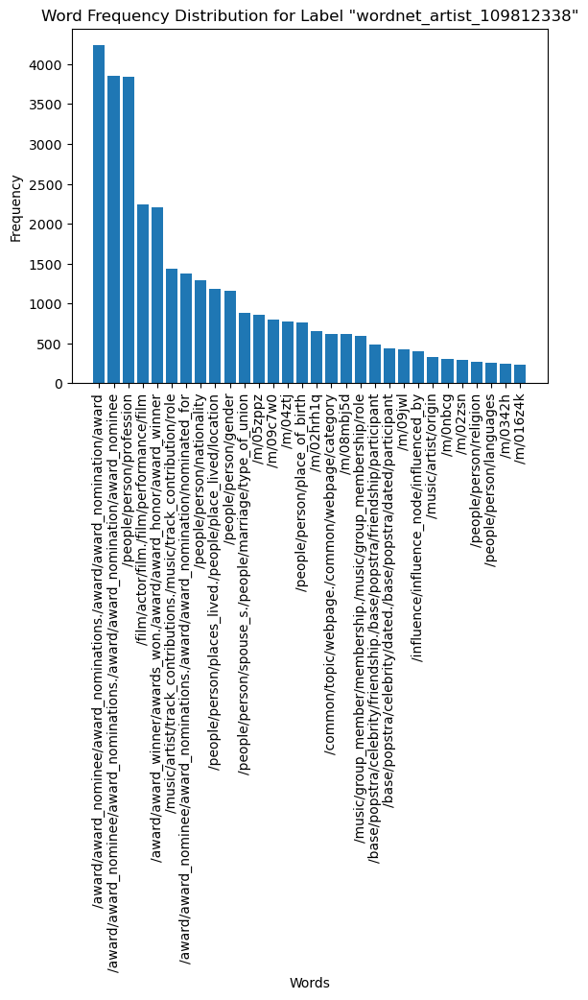

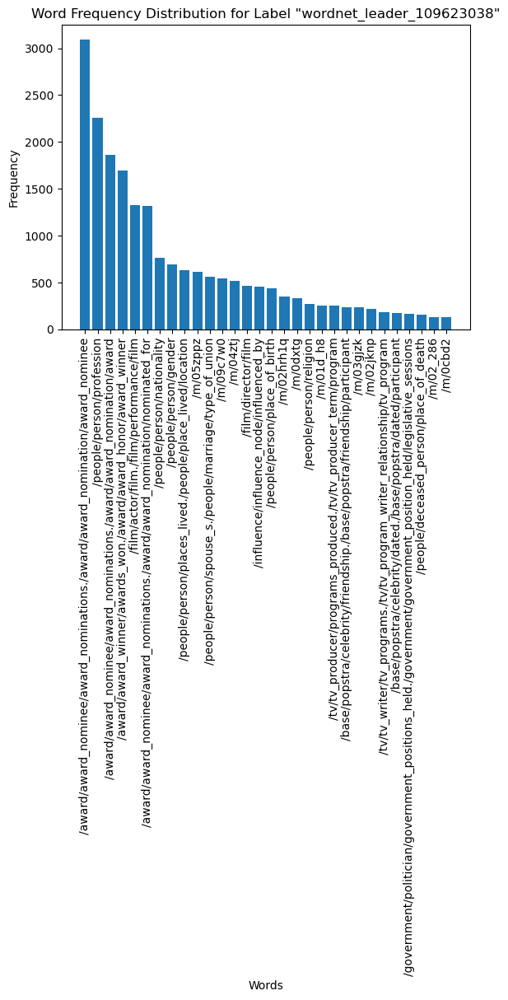

In [33]:
# # # Call to visualize
visualize_word_distribution(subject_documents, "wordnet_artist_109812338", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_entertainer_109616922", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_communicator_109610660", reference_data)

# # visualize_word_distribution(subject_documents, "wordnet_scientist_110560637", reference_data)

visualize_word_distribution(subject_documents, "wordnet_leader_109623038", reference_data)

# Call to visualize
# visualize_word_distribution(subject_documents, "wordnet_artist_109812338", reference_data)

# # visualize_word_distribution(subject_documents, "wordnet_officeholder_110371450", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_writer_110794014", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_scientist_110560637", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_politician_110450303", reference_data)

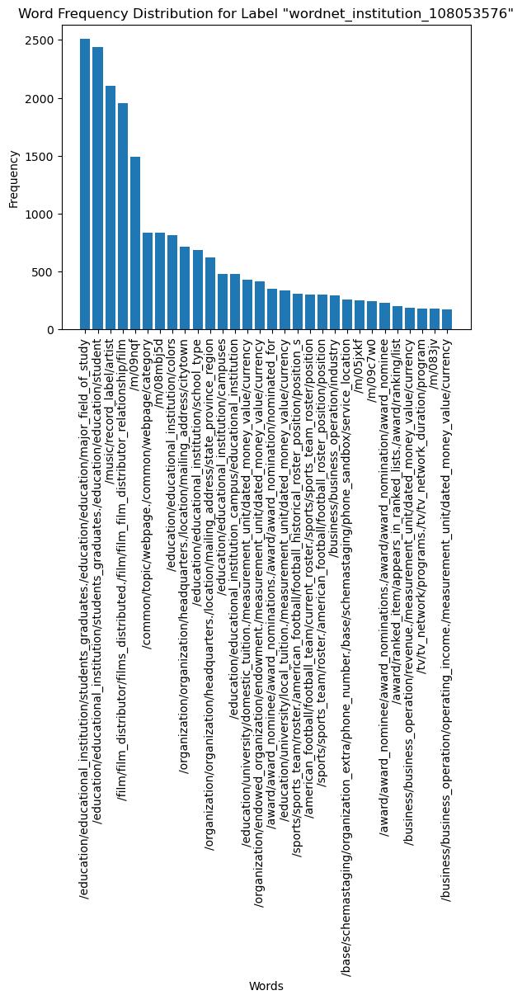

In [36]:
# Call to visualize
# visualize_word_distribution(subject_documents, "wordnet_musical_organization_108246613", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_party_108256968", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_enterprise_108056231", reference_data)

visualize_word_distribution(subject_documents, "wordnet_institution_108053576", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_nongovernmental_organization_108009834", reference_data)

multi label entities for one 

In [37]:
def visualize_word_distribution(subject_documents, label, reference_data):

    # Identify multi-label entities
    multi_label_entities = reference_data.groupby('entities')['classes'].nunique()
    multi_label_entities = multi_label_entities[multi_label_entities > 1].index.tolist()

    # Filter entities with the given label
    labeled_entities = reference_data[reference_data['classes'] == label]['entities']

    # Filter out entities not in subject_documents or not having a multi label
    entities_to_visualize = [e for e in labeled_entities if e in subject_documents and e in multi_label_entities]

    # Aggregate word frequencies
    word_freq = Counter()
    for entity in entities_to_visualize:
        word_freq.update(subject_documents[entity])

    # Visualize
    words, counts = zip(*word_freq.most_common()[:30])
    plt.bar(words, counts)
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.title(f'Word Frequency Distribution for Label "{label}"')
    plt.xticks(rotation=90)
    plt.show()

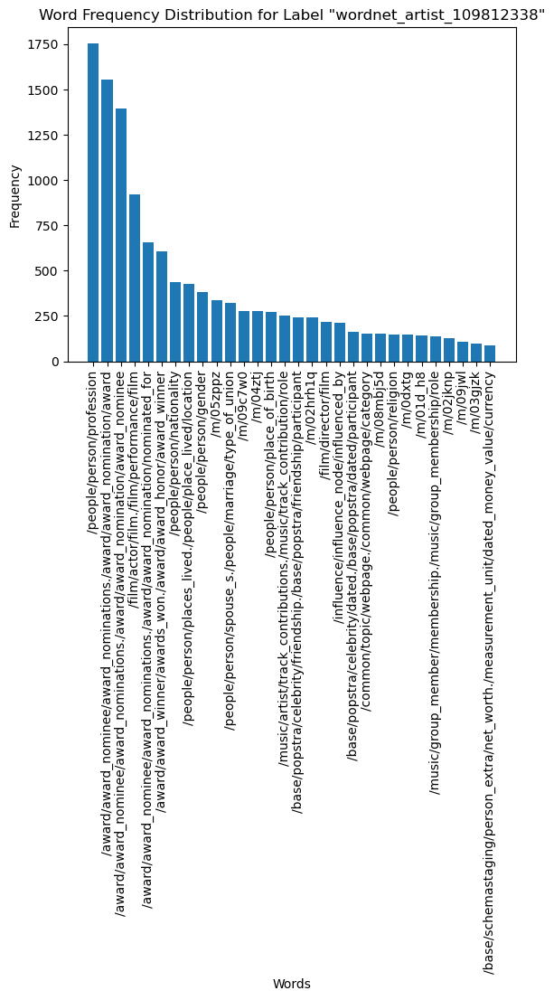

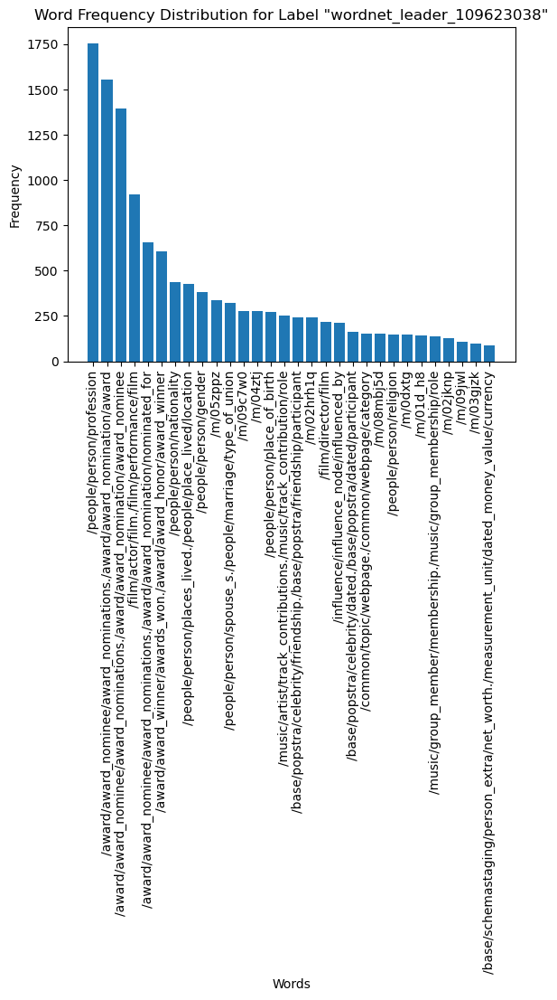

In [38]:
# # Call to visualize
visualize_word_distribution(subject_documents, "wordnet_artist_109812338", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_entertainer_109616922", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_communicator_109610660", reference_data)

# # visualize_word_distribution(subject_documents, "wordnet_scientist_110560637", reference_data)

visualize_word_distribution(subject_documents, "wordnet_leader_109623038", reference_data)

# # Call to visualize
# visualize_word_distribution(subject_documents, "wordnet_artist_109812338", reference_data)

# # visualize_word_distribution(subject_documents, "wordnet_officeholder_110371450", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_writer_110794014", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_scientist_110560637", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_politician_110450303", reference_data)

In [39]:
# Call to visualize
# visualize_word_distribution(subject_documents, "wordnet_musical_organization_108246613", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_party_108256968", reference_data)

# visualize_word_distribution(subject_documents, "wordnet_enterprise_108056231", reference_data)

visualize_word_distribution(subject_documents, "wordnet_institution_108053576", reference_data)  # no multiple one for balanced data

# visualize_word_distribution(subject_documents, "wordnet_nongovernmental_organization_108009834", reference_data)

ValueError: not enough values to unpack (expected 2, got 0)

data prepare for nhdp

In [1]:
import pandas as pd

def preprocess(raw_data, reference_data):
    """
    Preprocess raw data by organizing entities, relations, and objects based on a reference dataset.

    Args:
    raw_data (pd.DataFrame): DataFrame of the raw data containing columns for subject, predicate, and object.
    reference_data (pd.DataFrame): DataFrame containing entity references.

    Returns:
    tuple: A tuple containing:
        - subject_documents (dict): Dictionary with subjects as keys and lists of predicates and objects as values.
        - vocab (list): Sorted list of the vocabulary.
        - new_data_df (pd.DataFrame): DataFrame containing processed triples.
        - all_subjects (list): List of all subjects found in the reference data.
    """
    
    # Filter raw_data to include subjects found in reference_data
    filtered_data = raw_data[raw_data['Subject'].isin(reference_data['entities'])]

    # Extracting subjects
    all_subjects = filtered_data['Subject'].unique().tolist()
    print(f"Number of subjects: {len(all_subjects)}")

    # Grouping predicates and objects by subjects
    grouped = filtered_data.groupby('Subject')
    # print('Grouping predicates and objects by subjects',grouped)

    subject_documents = {subj: group[['Predicate', 'Object']].values.flatten().tolist() for subj, group in grouped}
    print('subject_documents',subject_documents)

    # Creating vocabulary
    vocab = sorted(set(sum(subject_documents.values(), [])))  # Flattens the list of lists and then converts to a set for unique elements
    vocab_index = {w: i for i, w in enumerate(vocab)}

    # Creating a corpus with indexed vocabulary
    indexed_corpus = {subj: [vocab_index[word] for word in words] for subj, words in subject_documents.items()}

    return indexed_corpus, vocab, filtered_data, all_subjects, subject_documents

# Load the raw data as a DataFrame
try:
    raw_data = pd.read_csv('data/fb15k-237/train.txt', delimiter='\t', names=['Subject', 'Predicate', 'Object'])
    print('---------- Raw data loaded successfully ----------')

    # Load reference data and filter out unreferenced entities
    reference_data = pd.read_csv('data/fb15k-237/freebase_reference_data_nhdp_20231030-154020.csv')
    # reference_data = pd.read_csv('data/fb15k-237/freebase_reference_data_nhdp_20231207-075638.csv')
    # reference_data = pd.read_csv('data/fb15k-237/freebase_reference_data_nhdp_20231215-160315.csv')
    # reference_data = pd.read_csv('data/fb15k-237/freebase_reference_data_nhdp_20240102-162052.csv')
    # reference_data = pd.read_csv('data/fb15k-237/freebase_reference_data_nhdp_20240102-170616.csv')
    reference_data = reference_data[reference_data['entities'].isin(raw_data['Subject'])].reset_index(drop=True)
    print(reference_data)

    # Preprocessing
    indexed_corpus, vocab, new_data_df, all_subjects, subject_documents = preprocess(raw_data, reference_data)

    # Output sample for verification
    print(f"Sample processed data:\n{new_data_df}")
    print(f"Sample indexed corpus for a subject:\n{next(iter(indexed_corpus.items()))}")
    print(f"Sample vocabulary:\n{vocab[:10]}")

except Exception as e:
    print(f"An error occurred: {e}")


---------- Raw data loaded successfully ----------
                            classes    entities  \
0     wordnet_institution_108053576   /m/01y67v   
1     wordnet_institution_108053576  /m/026wmz6   
2     wordnet_institution_108053576   /m/012vwb   
3     wordnet_institution_108053576   /m/09f5vv   
4     wordnet_institution_108053576    /m/05q2c   
...                             ...         ...   
4452       wordnet_artist_109812338   /m/016gkf   
4453       wordnet_artist_109812338    /m/019fz   
4454       wordnet_artist_109812338   /m/012d40   
4455       wordnet_artist_109812338   /m/0cdf37   
4456       wordnet_artist_109812338    /m/04bgy   

                       level1classes  
0     wordnet_organization_108008335  
1     wordnet_organization_108008335  
2     wordnet_organization_108008335  
3     wordnet_organization_108008335  
4     wordnet_organization_108008335  
...                              ...  
4452        wordnet_person_100007846  
4453        wordnet_pers

In [2]:
import pickle

# Define the file path
file_path = 'data/fb15k-237/subject_documents_20231030-154020.pkl'

# Save the subject documents to the file
with open(file_path, 'wb') as file:
    pickle.dump(subject_documents, file)

print(f"Subject documents saved to {file_path}")


Subject documents saved to data/fb15k-237/subject_documents.pkl


In [41]:
unique_entities_total = reference_data['entities'].nunique()
print('unique entities',unique_entities_total)
print(len(indexed_corpus))
print(len(subject_documents))

unique entities 3988
3988
3988


In [42]:
# Analyzing the unique and multiple label samples based on the 'classes' column

# Counting the number of unique labels
unique_labels = reference_data['classes'].nunique()

# Grouping by entities to find out how many labels each entity has
labels_per_entity = reference_data.groupby('entities')['classes'].nunique()
print(labels_per_entity)

# Counting how many entities have a single label vs multiple labels
single_label_count = (labels_per_entity == 1).sum()
multiple_label_count = (labels_per_entity > 1).sum()

print('unique sencond hierarchy label',unique_labels)
print('single label count',single_label_count)
print('multiple label count',multiple_label_count)

entities
/m/010hn     1
/m/010xjr    2
/m/011_3s    1
/m/011hdn    1
/m/011k11    1
            ..
/m/0yxl      1
/m/0z07      1
/m/0z4s      1
/m/0z90c     1
/m/0zjpz     2
Name: classes, Length: 3988, dtype: int64
unique sencond hierarchy label 3
single label count 3519
multiple label count 469


In [43]:
import pandas as pd
from datetime import datetime

def word_count_func(text):
    '''
    Counts words within a string.
    
    Args:
        text (str): String to be processed.
    
    Returns:
        dict: A dictionary with words as keys and counts as values.
    ''' 
    counts = {}
    words = text.split() if isinstance(text, str) else text

    for word in words:
        counts[word] = counts.get(word, 0) + 1

    return counts

# Replace 'new_corpus' with your actual corpus data
new_corpus = indexed_corpus  # Your list of documents goes here
vocab = vocab  # Your list of vocabulary words goes here
all_data = {'doc_key':[],'doc_idx': [], 'word_idx': [], 'count': []}

# Generate a timestamp
timestamp = datetime.now().strftime('%Y%m%d%H%M%S')

for doc_idx, (doc_key, text_value) in enumerate(subject_documents.items()):
    words_count_dict = word_count_func(text_value)
    for word, count in words_count_dict.items():
        all_data['doc_key'].append(doc_key) # no for nhdp
        all_data['doc_idx'].append(doc_idx)
        word_idx = vocab.index(word) if word in vocab else -1  # -1 if the word is not found
        all_data['word_idx'].append(word_idx)
        all_data['count'].append(count)

corpus_df = pd.DataFrame(all_data)

# Save the DataFrame to a CSV file
filename = f'data/fb15k-237/corpus_po_{timestamp}.txt'
corpus_df_to_save = corpus_df[['doc_idx', 'word_idx', 'count']]  # Remove the 'doc_key' column
corpus_df_to_save.to_csv(filename, sep=' ', index=False, header=False)
print(f'DataFrame saved to {filename}')

# Optional: Print statements (can be removed or commented out in production code)
print(len(all_data['doc_idx']))
print(corpus_df)
print(corpus_df[corpus_df['count'] > 1])  # Rows where count is greater than 1

# Create and save the vocabulary DataFrame
vocab_df = pd.DataFrame({'vocab': vocab})
vocab_filename = f'data/fb15k-237/vocab_po_{timestamp}.txt'
vocab_df.to_csv(vocab_filename, index=False, header=False)
print(f'Vocabulary DataFrame saved to {vocab_filename}')
print(vocab_df.iloc[210])


DataFrame saved to data/fb15k-237/corpus_po_20240102172952.txt
105157
         doc_key  doc_idx  word_idx  count
0       /m/010hn        0      9105      3
1       /m/010hn        0      1318      2
2       /m/010hn        0        30      1
3       /m/010hn        0      6634      1
4       /m/010hn        0      6958      1
...          ...      ...       ...    ...
105152  /m/0zjpz     3987      9110      1
105153  /m/0zjpz     3987       643      1
105154  /m/0zjpz     3987      2223      1
105155  /m/0zjpz     3987      9101      1
105156  /m/0zjpz     3987      5701      1

[105157 rows x 4 columns]
         doc_key  doc_idx  word_idx  count
0       /m/010hn        0      9105      3
1       /m/010hn        0      1318      2
5       /m/010hn        0      9106      4
7       /m/010hn        0         2      6
15      /m/010hn        0      2926      2
...          ...      ...       ...    ...
105124  /m/0z90c     3986      9091      2
105130  /m/0zjpz     3987      6730      3


results analysis

In [17]:
all_data = corpus_df

single label subtree

In [18]:
def filter_single_label_entities(reference_data, label):
    """
    Filter single-label entities with a given label from the reference data.

    Args:
    reference_data (pd.DataFrame): DataFrame containing entity references.
    label (str): The label to filter the entities.

    Returns:
    pd.DataFrame: Filtered DataFrame containing single-label entities with the given label.
    """
    single_label_entities = reference_data.groupby('entities')['classes'].nunique()
    single_label_entities = single_label_entities[single_label_entities == 1].index.tolist()

    filtered_data = reference_data[(reference_data['entities'].isin(single_label_entities)) & (reference_data['classes'] == label)]

    return filtered_data


In [19]:
# filtered_data_artist = filter_single_label_entities(reference_data, "wordnet_artist_109812338")
# print(filtered_data_artist.head())
# filtered_data_entertainer = filter_single_label_entities(reference_data, "wordnet_entertainer_109616922")
# print(filtered_data_entertainer.head())
# filtered_data_communicator = filter_single_label_entities(reference_data, "wordnet_communicator_109610660")
# print(filtered_data_communicator.head())
# filtered_data_scientist = filter_single_label_entities(reference_data, "wordnet_scientist_110560637")
# print(filtered_data_scientist.head())

filtered_data_artist = filter_single_label_entities(reference_data, "wordnet_artist_109812338")
print(filtered_data_artist.head())
filtered_data_officeholder = filter_single_label_entities(reference_data, "wordnet_officeholder_110371450")
print(filtered_data_officeholder.head())
filtered_data_writer = filter_single_label_entities(reference_data, "wordnet_writer_110794014")
print(filtered_data_writer.head())
filtered_data_scientist = filter_single_label_entities(reference_data, "wordnet_scientist_110560637")
print(filtered_data_scientist.head())
filtered_data_politician = filter_single_label_entities(reference_data, "wordnet_politician_110450303")
print(filtered_data_politician.head())

                       classes    entities             level1classes
3553  wordnet_artist_109812338    /m/0hpz8  wordnet_person_100007846
3555  wordnet_artist_109812338   /m/02cgb8  wordnet_person_100007846
3556  wordnet_artist_109812338  /m/01k_0fp  wordnet_person_100007846
3560  wordnet_artist_109812338    /m/049qx  wordnet_person_100007846
3561  wordnet_artist_109812338   /m/02x8kk  wordnet_person_100007846
                             classes   entities             level1classes
5850  wordnet_officeholder_110371450  /m/02c_wc  wordnet_person_100007846
5854  wordnet_officeholder_110371450  /m/07jrjb  wordnet_person_100007846
5894  wordnet_officeholder_110371450  /m/01fx5l  wordnet_person_100007846
5900  wordnet_officeholder_110371450  /m/01s7z0  wordnet_person_100007846
                       classes   entities             level1classes
1634  wordnet_writer_110794014  /m/02t__3  wordnet_person_100007846
1635  wordnet_writer_110794014  /m/01xv77  wordnet_person_100007846
1636  wordne

In [12]:
print(filtered_data_artist.entities)

8217      /m/03_fk9
8222      /m/09swkk
8238      /m/02zmh5
8258     /m/026v_78
8297      /m/0f3zf_
            ...    
10004     /m/06kkgw
10007      /m/048xh
10012     /m/0b6yp2
10020     /m/0b82vw
10091     /m/076psv
Name: entities, Length: 148, dtype: object


In [13]:
filtered_data_artist = filter_single_label_entities(reference_data, "wordnet_artist_109812338")
print(filtered_data_artist.head())
single_label_entity_artist = filtered_data_artist.entities.iloc[0]  # Replace 0 with the index of the single-label entity you want to check
print(single_label_entity_artist)
entity_data = all_data[all_data['doc_key'] == single_label_entity_artist]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == single_label_entity_artist])
print(subject_documents[single_label_entity_artist])


/m/03_fk9
         doc_key  doc_idx  word_idx  count
74206  /m/03_fk9     2748      9473      1
74207  /m/03_fk9     2748      4560      1
74208  /m/03_fk9     2748         4      6
74209  /m/03_fk9     2748      7535      1
74210  /m/03_fk9     2748      9474      1
74211  /m/03_fk9     2748      6067      1
74212  /m/03_fk9     2748      5335      1
74213  /m/03_fk9     2748      9471      1
74214  /m/03_fk9     2748      5914      1
74215  /m/03_fk9     2748      8704      2
74216  /m/03_fk9     2748        46      1
74217  /m/03_fk9     2748      3502      1
74218  /m/03_fk9     2748      4016      1
74219  /m/03_fk9     2748      9412      1
74220  /m/03_fk9     2748      9476      1
74221  /m/03_fk9     2748      7827      1
74222  /m/03_fk9     2748         2      1
74223  /m/03_fk9     2748      8370      1
                       classes   entities             level1classes
8298  wordnet_artist_109812338  /m/03_fk9  wordnet_person_100007846
['/people/person/nationality', '/m/03

In [14]:
filtered_data_entertainer = filter_single_label_entities(reference_data, "wordnet_entertainer_109616922")
print(filtered_data_entertainer.head())
single_label_entity_entertainer = filtered_data_entertainer.entities.iloc[0]  # Replace 0 with the index of the single-label entity you want to check
print(single_label_entity_entertainer)
entity_data = all_data[all_data['doc_key'] == single_label_entity_entertainer]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == single_label_entity_entertainer])
print(subject_documents[single_label_entity_entertainer])



                            classes    entities             level1classes
1637  wordnet_entertainer_109616922  /m/01qvtwm  wordnet_person_100007846
1639  wordnet_entertainer_109616922   /m/02z1yj  wordnet_person_100007846
1640  wordnet_entertainer_109616922   /m/04smkr  wordnet_person_100007846
1643  wordnet_entertainer_109616922   /m/01j5ws  wordnet_person_100007846
1648  wordnet_entertainer_109616922   /m/0fr7nt  wordnet_person_100007846
/m/01qvtwm
          doc_key  doc_idx  word_idx  count
31082  /m/01qvtwm     1100      9471      1
31083  /m/01qvtwm     1100      5914      1
31084  /m/01qvtwm     1100        46      3
31085  /m/01qvtwm     1100      6583      1
31086  /m/01qvtwm     1100      9473      1
31087  /m/01qvtwm     1100      4110      1
31088  /m/01qvtwm     1100      9475      1
31089  /m/01qvtwm     1100      6488      1
31090  /m/01qvtwm     1100      3813      1
31091  /m/01qvtwm     1100      3809      1
31092  /m/01qvtwm     1100        47      1
31093  /m/01qvtwm

In [15]:
filtered_data_communicator = filter_single_label_entities(reference_data, "wordnet_communicator_109610660")
print(filtered_data_communicator.head())
single_label_entity_communicator = filtered_data_communicator.entities.iloc[0]  # Replace 0 with the index of the single-label entity you want to check
print(single_label_entity_communicator)
entity_data = all_data[all_data['doc_key'] == single_label_entity_communicator]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == single_label_entity_communicator])
print(subject_documents[single_label_entity_communicator])


                             classes    entities             level1classes
4806  wordnet_communicator_109610660  /m/0jt90f5  wordnet_person_100007846
4810  wordnet_communicator_109610660   /m/01cspq  wordnet_person_100007846
4824  wordnet_communicator_109610660    /m/026m0  wordnet_person_100007846
4827  wordnet_communicator_109610660    /m/0821j  wordnet_person_100007846
4836  wordnet_communicator_109610660    /m/04093  wordnet_person_100007846
/m/0jt90f5
           doc_key  doc_idx  word_idx  count
140285  /m/0jt90f5     5357        21      1
140286  /m/0jt90f5     5357      7087      1
140287  /m/0jt90f5     5357        74     11
140288  /m/0jt90f5     5357      2484      1
140289  /m/0jt90f5     5357      6085      1
140290  /m/0jt90f5     5357      4774      1
140291  /m/0jt90f5     5357      9471      1
140292  /m/0jt90f5     5357      5914      1
140293  /m/0jt90f5     5357         2      5
140294  /m/0jt90f5     5357      2558      1
140295  /m/0jt90f5     5357      9476      3

In [16]:
filtered_data_scientist = filter_single_label_entities(reference_data, "wordnet_scientist_110560637")
print(filtered_data_scientist.head())
single_label_entity_scientist = filtered_data_scientist.entities.iloc[0]  # Replace 0 with the index of the single-label entity you want to check
print(single_label_entity_scientist)
entity_data = all_data[all_data['doc_key'] == single_label_entity_scientist]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == single_label_entity_scientist])
print(subject_documents[single_label_entity_scientist])

                           classes  entities             level1classes
10125  wordnet_scientist_110560637  /m/029rk  wordnet_person_100007846
10143  wordnet_scientist_110560637  /m/01t_z  wordnet_person_100007846
10147  wordnet_scientist_110560637   /m/0n00  wordnet_person_100007846
10164  wordnet_scientist_110560637  /m/059y0  wordnet_person_100007846
10197  wordnet_scientist_110560637  /m/05d1y  wordnet_person_100007846
/m/029rk
        doc_key  doc_idx  word_idx  count
53452  /m/029rk     1923      9471      1
53453  /m/029rk     1923      5914      1
53454  /m/029rk     1923      9475      1
53455  /m/029rk     1923      3979      1
53456  /m/029rk     1923        75      1
53457  /m/029rk     1923      8618      1
53458  /m/029rk     1923      9476      1
53459  /m/029rk     1923      5263      1
                           classes  entities             level1classes
10209  wordnet_scientist_110560637  /m/029rk  wordnet_person_100007846
['/people/person/gender', '/m/05zppz', '/peop

In [17]:
filtered_data_leader = filter_single_label_entities(reference_data, "wordnet_leader_109623038")
print(filtered_data_leader.head())
single_label_entity_leader = filtered_data_leader.entities.iloc[0]  # Replace 0 with the index of the single-label entity you want to check
print(single_label_entity_leader)
entity_data = all_data[all_data['doc_key'] == single_label_entity_leader]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == single_label_entity_leader])
print(subject_documents[single_label_entity_leader])



                       classes   entities             level1classes
6889  wordnet_leader_109623038  /m/024tcq  wordnet_person_100007846
6894  wordnet_leader_109623038  /m/0cg39k  wordnet_person_100007846
6896  wordnet_leader_109623038  /m/07hhnl  wordnet_person_100007846
6904  wordnet_leader_109623038  /m/03txms  wordnet_person_100007846
6908  wordnet_leader_109623038  /m/0fw2d3  wordnet_person_100007846
/m/024tcq
         doc_key  doc_idx  word_idx  count
48385  /m/024tcq     1717        67     40
48386  /m/024tcq     1717      4972      1
48387  /m/024tcq     1717        68     22
48388  /m/024tcq     1717      4719      1
48389  /m/024tcq     1717      5101      1
...          ...      ...       ...    ...
48444  /m/024tcq     1717      4970      1
48445  /m/024tcq     1717      2151      1
48446  /m/024tcq     1717      8188      1
48447  /m/024tcq     1717      2899      1
48448  /m/024tcq     1717      2904      1

[64 rows x 4 columns]
                       classes   entities  

In [18]:
filtered_data_music = filter_single_label_entities(reference_data, "wordnet_musical_organization_108246613")
print(filtered_data_music.head())
single_label_entity_music = filtered_data_music.entities.iloc[0]  # Replace 0 with the index of the single-label entity you want to check
print(single_label_entity_music)
entity_data = all_data[all_data['doc_key'] == single_label_entity_music]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == single_label_entity_music])
print(subject_documents[single_label_entity_music])


                                     classes   entities  \
1400  wordnet_musical_organization_108246613   /m/089tm   
1401  wordnet_musical_organization_108246613  /m/01dpts   
1402  wordnet_musical_organization_108246613   /m/0b1zz   
1403  wordnet_musical_organization_108246613  /m/03j_hq   
1405  wordnet_musical_organization_108246613  /m/01k_yf   

                       level1classes  
1400  wordnet_organization_108008335  
1401  wordnet_organization_108008335  
1402  wordnet_organization_108008335  
1403  wordnet_organization_108008335  
1405  wordnet_organization_108008335  
/m/089tm
         doc_key  doc_idx  word_idx  count
117936  /m/089tm     4505         2      7
117937  /m/089tm     4505      3012      1
117938  /m/089tm     4505       971      1
117939  /m/089tm     4505      3013      1
117940  /m/089tm     4505      3014      1
117941  /m/089tm     4505      3009      1
117942  /m/089tm     4505        30      1
117943  /m/089tm     4505      6872      1
117944  /m/089t

In [19]:
filtered_data_party = filter_single_label_entities(reference_data, "wordnet_party_108256968")
print(filtered_data_party.head())
single_label_entity_party = filtered_data_party.entities.iloc[0]  # Replace 0 with the index of the single-label entity you want to check
print(single_label_entity_party)
entity_data = all_data[all_data['doc_key'] == single_label_entity_party]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == single_label_entity_party])
print(subject_documents[single_label_entity_party])



                      classes   entities                   level1classes
1595  wordnet_party_108256968   /m/01fml  wordnet_organization_108008335
1596  wordnet_party_108256968   /m/049tb  wordnet_organization_108008335
1597  wordnet_party_108256968  /m/01x6d4  wordnet_organization_108008335
1598  wordnet_party_108256968   /m/07wf9  wordnet_organization_108008335
1599  wordnet_party_108256968    /m/0_00  wordnet_organization_108008335
/m/01fml
        doc_key  doc_idx  word_idx  count
19153  /m/01fml      665        69      3
19154  /m/01fml      665      7046      1
19155  /m/01fml      665      6756      1
19156  /m/01fml      665      8886      1
                      classes  entities                   level1classes
1665  wordnet_party_108256968  /m/01fml  wordnet_organization_108008335
['/government/political_party/politicians_in_this_party./government/political_party_tenure/politician', '/m/09gnn', '/government/political_party/politicians_in_this_party./government/political_party_

In [20]:
filtered_data_enterprise = filter_single_label_entities(reference_data, "wordnet_enterprise_108056231")
print(filtered_data_enterprise.head())
single_label_entity_enterprise = filtered_data_enterprise.entities.iloc[0]  # Replace 0 with the index of the single-label entity you want to check
print(single_label_entity_enterprise)
entity_data = all_data[all_data['doc_key'] == single_label_entity_enterprise]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == single_label_entity_enterprise])
print(subject_documents[single_label_entity_enterprise])



                           classes    entities                   level1classes
1307  wordnet_enterprise_108056231   /m/032c7m  wordnet_organization_108008335
1338  wordnet_enterprise_108056231  /m/02h53vq  wordnet_organization_108008335
1381  wordnet_enterprise_108056231    /m/059yj  wordnet_organization_108008335
/m/032c7m
         doc_key  doc_idx  word_idx  count
70493  /m/032c7m     2602      9484      3
70494  /m/032c7m     2602      2843      2
70495  /m/032c7m     2602      9485      4
70496  /m/032c7m     2602      3343      2
70497  /m/032c7m     2602      7833      2
70498  /m/032c7m     2602      3574      1
                           classes   entities                   level1classes
1349  wordnet_enterprise_108056231  /m/032c7m  wordnet_organization_108008335
['/soccer/football_team/current_roster./soccer/football_roster_position/position', '/m/02_j1w', '/soccer/football_team/current_roster./sports/sports_team_roster/position', '/m/02_j1w', '/soccer/football_team/current_r

In [21]:
filtered_data_institution = filter_single_label_entities(reference_data, "wordnet_institution_108053576")
print(filtered_data_institution.head())
single_label_entity_institution = filtered_data_institution.entities.iloc[0]  # Replace 0 with the index of the single-label entity you want to check
print(single_label_entity_institution)
entity_data = all_data[all_data['doc_key'] == single_label_entity_institution]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == single_label_entity_institution])
print(subject_documents[single_label_entity_institution])



                         classes    entities                   level1classes
0  wordnet_institution_108053576    /m/0j47s  wordnet_organization_108008335
1  wordnet_institution_108053576  /m/02x2097  wordnet_organization_108008335
2  wordnet_institution_108053576   /m/016ckq  wordnet_organization_108008335
3  wordnet_institution_108053576   /m/03y5ky  wordnet_organization_108008335
4  wordnet_institution_108053576   /m/05ftw3  wordnet_organization_108008335
/m/0j47s
         doc_key  doc_idx  word_idx  count
139278  /m/0j47s     5319      9484      3
139279  /m/0j47s     5319      3574      2
139280  /m/0j47s     5319        19      1
139281  /m/0j47s     5319      3108      1
139282  /m/0j47s     5319      9485      3
139283  /m/0j47s     5319      2843      2
139284  /m/0j47s     5319      9495      1
139285  /m/0j47s     5319      3665      1
139286  /m/0j47s     5319      3343      1
139287  /m/0j47s     5319        20      1
139288  /m/0j47s     5319      6635      1
139289  /m/0j

In [22]:
filtered_data_nongovernmental = filter_single_label_entities(reference_data, "wordnet_nongovernmental_organization_108009834")
print(filtered_data_nongovernmental.head())
single_label_entity_nongovernmental = filtered_data_nongovernmental.entities.iloc[0]  # Replace 0 with the index of the single-label entity you want to check
print(single_label_entity_nongovernmental)
entity_data = all_data[all_data['doc_key'] == single_label_entity_nongovernmental]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == single_label_entity_nongovernmental])
print(subject_documents[single_label_entity_nongovernmental])

                                             classes    entities  \
1549  wordnet_nongovernmental_organization_108009834    /m/05sfs   
1560  wordnet_nongovernmental_organization_108009834   /m/03f2fw   
1563  wordnet_nongovernmental_organization_108009834   /m/02vxy_   
1565  wordnet_nongovernmental_organization_108009834    /m/072w0   
1588  wordnet_nongovernmental_organization_108009834  /m/0g5llry   

                       level1classes  
1549  wordnet_organization_108008335  
1560  wordnet_organization_108008335  
1563  wordnet_organization_108008335  
1565  wordnet_organization_108008335  
1588  wordnet_organization_108008335  
/m/05sfs
         doc_key  doc_idx  word_idx  count
101965  /m/05sfs     3879      9505      1
101966  /m/05sfs     3879      5198      1
                                             classes  entities  \
1604  wordnet_nongovernmental_organization_108009834  /m/05sfs   

                       level1classes  
1604  wordnet_organization_108008335  
['/user/

multi label subtree

In [23]:
# Create a function to filter multi-label entities
def filter_multi_label_entities(reference_data, label):
    """
    Filter multi-label entities with a given label from the reference data.

    Args:
    reference_data (pd.DataFrame): DataFrame containing entity references.
    label (str): The label to filter the entities.

    Returns:
    pd.DataFrame: Filtered DataFrame containing multi-label entities with the given label.
    """
    multi_label_entities = reference_data.groupby('entities')['classes'].nunique()
    multi_label_entities = multi_label_entities[multi_label_entities > 1].index.tolist()

    filtered_data = reference_data[(reference_data['entities'].isin(multi_label_entities)) & (reference_data['classes'] == label)]

    return filtered_data




In [26]:


filtered_data_artist = filter_multi_label_entities(reference_data, "wordnet_artist_109812338")
print(filtered_data_artist.head())
multi_label_entity_artist = filtered_data_artist.entities.iloc[0]  # Replace 0 with the index of the multi-label entity you want to check
print(multi_label_entity_artist)
entity_data = all_data[all_data['doc_key'] == multi_label_entity_artist]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == multi_label_entity_artist])
print(subject_documents[multi_label_entity_artist])

filtered_data_entertainer = filter_multi_label_entities(reference_data, "wordnet_entertainer_109616922")
print(filtered_data_entertainer.head())
multi_label_entity_entertainer = filtered_data_entertainer.entities.iloc[0]  # Replace 0 with the index of the multi-label entity you want to check
print(multi_label_entity_entertainer)
entity_data = all_data[all_data['doc_key'] == multi_label_entity_entertainer]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == multi_label_entity_entertainer])
print(subject_documents[multi_label_entity_entertainer])

filtered_data_communicator = filter_multi_label_entities(reference_data, "wordnet_communicator_109610660")
print(filtered_data_communicator.head())
multi_label_entity_communicator = filtered_data_communicator.entities.iloc[1]  # Replace 0 with the index of the multi-label entity you want to check
print(multi_label_entity_communicator)
entity_data = all_data[all_data['doc_key'] == multi_label_entity_communicator]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == multi_label_entity_communicator])
print(subject_documents[multi_label_entity_communicator])

filtered_data_scientist = filter_multi_label_entities(reference_data, "wordnet_scientist_110560637")
print(filtered_data_scientist.head())
multi_label_entity_scientist = filtered_data_scientist.entities.iloc[0]  # Replace 0 with the index of the multi-label entity you want to check
print(multi_label_entity_scientist)
entity_data = all_data[all_data['doc_key'] == multi_label_entity_scientist]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == multi_label_entity_scientist])
print(subject_documents[multi_label_entity_scientist])

filtered_data_leader = filter_multi_label_entities(reference_data, "wordnet_leader_109623038")
print(filtered_data_leader.head())
multi_label_entity_leader = filtered_data_leader.entities.iloc[0]  # Replace 0 with the index of the multi-label entity you want to check
print(multi_label_entity_leader)
entity_data = all_data[all_data['doc_key'] == multi_label_entity_leader]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == multi_label_entity_leader])
print(subject_documents[multi_label_entity_leader])







                       classes   entities             level1classes
8207  wordnet_artist_109812338  /m/0175wg  wordnet_person_100007846
8208  wordnet_artist_109812338  /m/025mb_  wordnet_person_100007846
8209  wordnet_artist_109812338   /m/0jfx1  wordnet_person_100007846
8210  wordnet_artist_109812338  /m/01qvgl  wordnet_person_100007846
8211  wordnet_artist_109812338  /m/02b25y  wordnet_person_100007846
/m/0175wg
         doc_key  doc_idx  word_idx  count
11075  /m/0175wg      373         3     17
11076  /m/0175wg      373      2947      1
11077  /m/0175wg      373      8895      1
11078  /m/0175wg      373         4      1
11079  /m/0175wg      373      2290      2
11080  /m/0175wg      373      5255      1
11081  /m/0175wg      373      5845      1
11082  /m/0175wg      373        46      4
11083  /m/0175wg      373      4214      1
11084  /m/0175wg      373      6177      1
11085  /m/0175wg      373      9476      1
11086  /m/0175wg      373      7732      1
11087  /m/0175wg      3

In [28]:
filtered_data_music = filter_multi_label_entities(reference_data, "wordnet_musical_organization_108246613")
print(filtered_data_music.head())
multi_label_entity_music = filtered_data_music.entities.iloc[0]  # Replace 0 with the index of the multi-label entity you want to check
print(multi_label_entity_music)
entity_data = all_data[all_data['doc_key'] == multi_label_entity_music]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == multi_label_entity_music])
print(subject_documents[multi_label_entity_music])

filtered_data_party = filter_multi_label_entities(reference_data, "wordnet_party_108256968")
print(filtered_data_party.head())
multi_label_entity_party = filtered_data_party.entities.iloc[0]  # Replace 0 with the index of the multi-label entity you want to check
print(multi_label_entity_party)
entity_data = all_data[all_data['doc_key'] == multi_label_entity_party]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == multi_label_entity_party])
print(subject_documents[multi_label_entity_party])

filtered_data_enterprise = filter_multi_label_entities(reference_data, "wordnet_enterprise_108056231")
print(filtered_data_enterprise.head())
multi_label_entity_enterprise = filtered_data_enterprise.entities.iloc[0]  # Replace 0 with the index of the multi-label entity you want to check
print(multi_label_entity_enterprise)
entity_data = all_data[all_data['doc_key'] == multi_label_entity_enterprise]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == multi_label_entity_enterprise])
print(subject_documents[multi_label_entity_enterprise])

filtered_data_institution = filter_multi_label_entities(reference_data, "wordnet_institution_108053576")
print(filtered_data_institution.head())
multi_label_entity_institution = filtered_data_institution.entities.iloc[1]  # Replace 0 with the index of the multi-label entity you want to check
print(multi_label_entity_institution)
entity_data = all_data[all_data['doc_key'] == multi_label_entity_institution]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == multi_label_entity_institution])
print(subject_documents[multi_label_entity_institution])

filtered_data_nongovernmental = filter_multi_label_entities(reference_data, "wordnet_nongovernmental_organization_108009834")
print(filtered_data_nongovernmental.head())
multi_label_entity_nongovernmental = filtered_data_nongovernmental.entities.iloc[0]  # Replace 0 with the index of the multi-label entity you want to check
print(multi_label_entity_nongovernmental)
entity_data = all_data[all_data['doc_key'] == multi_label_entity_nongovernmental]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == multi_label_entity_nongovernmental])
print(subject_documents[multi_label_entity_nongovernmental])

                                     classes    entities  \
1404  wordnet_musical_organization_108246613  /m/01lf293   
1418  wordnet_musical_organization_108246613   /m/04chyn   
1429  wordnet_musical_organization_108246613   /m/06br6t   

                       level1classes  
1404  wordnet_organization_108008335  
1418  wordnet_organization_108008335  
1429  wordnet_organization_108008335  
/m/01lf293
          doc_key  doc_idx  word_idx  count
25541  /m/01lf293      892         2      3
25542  /m/01lf293      892       906      1
25543  /m/01lf293      892       927      1
25544  /m/01lf293      892      9446      1
25545  /m/01lf293      892      2827      1
25546  /m/01lf293      892       957      1
                                     classes    entities  \
9              wordnet_institution_108053576  /m/01lf293   
1450  wordnet_musical_organization_108246613  /m/01lf293   

                       level1classes  
9     wordnet_organization_108008335  
1450  wordnet_organizatio

In [48]:
labels_per_entity = reference_data.groupby('entities')['classes'].nunique()
# Extracting entities with a single label and those with multiple labels
single_label_entities = labels_per_entity[labels_per_entity == 1].index.tolist()
print(single_label_entities)

# # Filter entities with the given label
# labeled_entities = reference_data[reference_data['classes'] == label]['entities']

single_label_entity = single_label_entities[2]  # Replace 0 with the index of the single-label entity you want to check
print(single_label_entity)
entity_data = all_data[all_data['doc_key'] == single_label_entity]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == single_label_entity])
print(subject_documents[single_label_entity])


['/m/011_vz', '/m/011k11', '/m/011kn2', '/m/011s9r', '/m/011xhx', '/m/011xy1', '/m/011zwl', '/m/01200d', '/m/012201', '/m/012b30', '/m/012bk', '/m/012c6j', '/m/012dr7', '/m/012dtf', '/m/012fvq', '/m/012g92', '/m/012gyf', '/m/012j5h', '/m/012ljv', '/m/012lzr', '/m/012vwb', '/m/012x03', '/m/012x1l', '/m/012x8m', '/m/01314k', '/m/01323p', '/m/0134pk', '/m/0134s5', '/m/0134w7', '/m/0135cw', '/m/0135dr', '/m/0135nb', '/m/0136kr', '/m/013719', '/m/013807', '/m/013_5c', '/m/013_vh', '/m/013pp3', '/m/013rfk', '/m/013vdl', '/m/013w2r', '/m/013w8y', '/m/013x0b', '/m/0143hl', '/m/0143q0', '/m/0146hc', '/m/014_lq', '/m/014d4v', '/m/014dd0', '/m/014hr0', '/m/014j0w', '/m/014jyk', '/m/014kyy', '/m/014l4w', '/m/014nvr', '/m/014pg1', '/m/014xf6', '/m/014zws', '/m/0150jk', '/m/0150t6', '/m/01516r', '/m/01518s', '/m/0152x_', '/m/0153nq', '/m/015401', '/m/01541z', '/m/015_1q', '/m/015bwt', '/m/015c2f', '/m/015cqh', '/m/015cxv', '/m/015cz0', '/m/015d3h', '/m/015dcj', '/m/015dnt', '/m/015fs3', '/m/015fsv',

In [44]:

multiple_label_entities = labels_per_entity[labels_per_entity > 1].index.tolist()
print(multiple_label_entities)
# Replace 0 with the index of the multi-label entity you want to retrieve
multi_label_entity = multiple_label_entities[0]
entity_data = all_data[all_data['doc_key'] == multi_label_entity]
print(entity_data)
print(entity_types_df.loc[entity_types_df['entities'] == multi_label_entity])

['/m/010hn', '/m/010p3', '/m/010xjr', '/m/0113sg', '/m/011_3s', '/m/011hdn', '/m/011k1h', '/m/011k4g', '/m/011lpr', '/m/011lvx', '/m/011vx3', '/m/011w20', '/m/011z3g', '/m/011zd3', '/m/011zf2', '/m/0121rx', '/m/0123j6', '/m/0126rp', '/m/0126y2', '/m/01271h', '/m/0127gn', '/m/0127m7', '/m/0127s7', '/m/0127xk', '/m/012_53', '/m/012c6x', '/m/012cj0', '/m/012cph', '/m/012d40', '/m/012gbb', '/m/012gq6', '/m/012gx2', '/m/012j8z', '/m/012ky3', '/m/012mzw', '/m/012q4n', '/m/012rng', '/m/012s5j', '/m/012t1', '/m/012v1t', '/m/012v9y', '/m/012vby', '/m/012vct', '/m/012vd6', '/m/012vf6', '/m/012wg', '/m/012x2b', '/m/012x4t', '/m/012xdf', '/m/012ycy', '/m/012ykt', '/m/012z8_', '/m/012zng', '/m/01304j', '/m/01309x', '/m/0130sy', '/m/0131kb', '/m/0132k4', '/m/01337_', '/m/0133sq', '/m/0133x7', '/m/013423', '/m/0135xb', '/m/01364q', '/m/0136g9', '/m/0136p1', '/m/0136pk', '/m/0137hn', '/m/0137n0', '/m/01385g', '/m/01386_', '/m/0139q5', '/m/013bd1', '/m/013cr', '/m/013km', '/m/013knm', '/m/013pk3', '/m/

In [ ]:
! pwd

In [ ]:
# hyperparameter [2 5], beta0 = 0.1
! python print-tree.py '../nHDP_matlab/output/tree/freebase/20231123_nhdp_tree_freebase_po_25_1000.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# corpus_po_20231106161156.txt

# hyperparameter [2 3], beta0 = 1
! python print-tree.py '../nHDP_matlab/output/tree/freebase/20231130_nhdp_tree_freebase_po_t23_b1_1000.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'


# hyperparameter [2 3], beta0 = 0.1
! python print-tree.py '../nHDP_matlab/output/tree/freebase/20231211_nhdp_tree_freebase_po_t23_b01_1000.csv' 'data/fb15k-237/vocab_po_20231211114748.txt'

# hyperparameter [2 3], beta0 = 1
! python print-tree.py '../nHDP_matlab/output/tree/freebase/20231211_nhdp_tree_freebase_po_t23_b1_1000.csv' 'data/fb15k-237/vocab_po_20231211114748.txt'

# hyperparameter [2 3], beta0 = 0.1
! python print-tree.py '../nHDP_matlab/output/tree/freebase/20231218_nhdp_tree_freebase_po_t23_b01_1000.csv' 'data/fb15k-237/vocab_po_20231218121308.txt'

# hyperparameter [2 3], beta0 = 1
! python print-tree.py '../nHDP_matlab/output/tree/freebase/20231218_nhdp_tree_freebase_po_t23_b1_1000.csv' 'data/fb15k-237/vocab_po_20231218121308.txt'

# hyperparameter [2 2], beta0 = 0.1
! python print-tree.py '../nHDP_matlab/output/tree/freebase/20240102_nhdp_tree_freebase_po_t22_b01_1000.csv' 'data/fb15k-237/vocab_po_20240102163507.txt'

# hyperparameter [2 2], beta0 = 1
! python print-tree.py '../nHDP_matlab/output/tree/freebase/20240102_nhdp_tree_freebase_po_t22_b1_1000.csv' 'data/fb15k-237/vocab_po_20240102163507.txt'

# hyperparameter [2 2], beta0 = 0.1
! python print-tree.py '../nHDP_matlab/output/tree/freebase/20240102_nhdp_tree_freebase_po_t22_b01_1000_172952.csv' 'data/fb15k-237/vocab_po_20240102172952.txt'

# hyperparameter [2 2], beta0 = 1
! python print-tree.py '../nHDP_matlab/output/tree/freebase/20240102_nhdp_tree_freebase_po_t22_b1_1000_172952.csv' 'data/fb15k-237/vocab_po_20240102172952.txt'

In [ ]:
# single label
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231123_6.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# single label
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231123_11.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'

In [ ]:
# multi label
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231123_1.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'

In [ ]:
# hyperparameter [2 3], beta0 = 0.1
! python print-tree.py '../nHDP_matlab/output/tree/freebase/20231127_nhdp_tree_freebase_po_23_1000.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# corpus_po_20231106161156.txt
# people
# single label artist id 2749
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_2749.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# single label entertainer id 1101
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_1101.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# single label communicator id 5358
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_5358.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# single label scientist id 1924
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_1924.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# single label leader id 1718
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_1718.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# organization
# single label musical organization id 4506
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_4506.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# single label party id 666
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_666.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# single label enterprise id 2603
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_2603.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# single label institution id 5320
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_5320.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# single label nongovernmental organization id 3880
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_3880.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'




In [ ]:
# multi label
# people
# multi label artist id 374
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_374.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# multi label entertainer id 4866
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_1866.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# multi label communicator id 4726
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_4726.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# multi label scientist id 929
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_929.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# multi label leader id 4726
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_4726.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# organization
# multi label musical organization id 893
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_893.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# multi label party id 4233
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_4233.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# multi label enterprise id 5605
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_5605.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# multi label institution id 1146
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_1146.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'
# multi label nongovernmental organization id 3241
! python print-tree.py '../nHDP_matlab/output/subtree/freebase_poseperate/nhdp_subtree_20231127_3241.csv' 'data/fb15k-237/vocab_po_20231106161156.txt'

go back to distribution

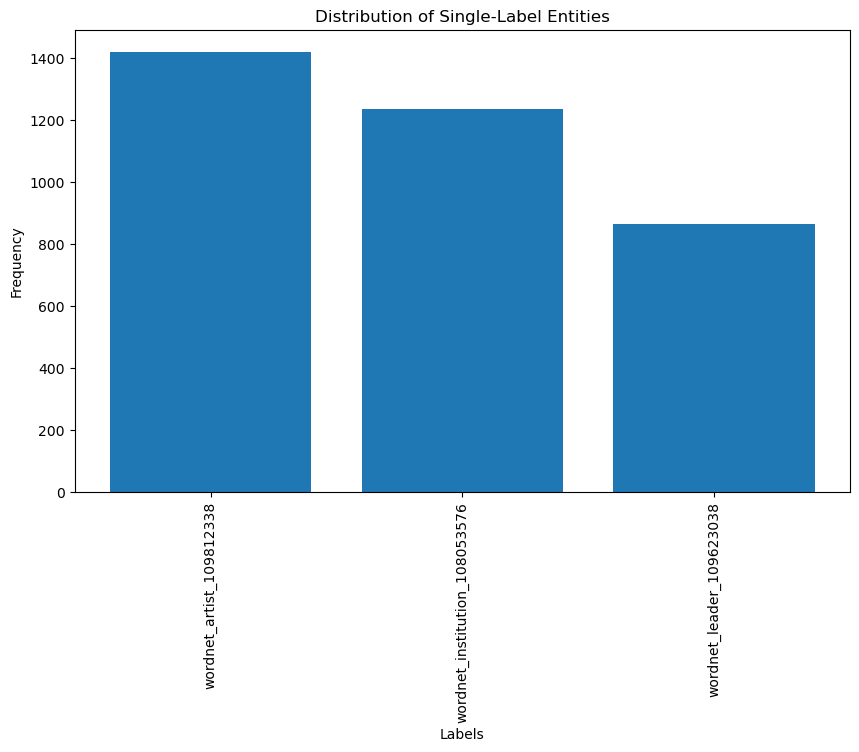

In [34]:
def visualize_single_label_distribution(reference_data):

    # Identify single-label entities
    single_label_entities = reference_data.groupby('entities')['classes'].nunique()
    single_label_entities = single_label_entities[single_label_entities == 1].index.tolist()

    # Count the number of entities with each label
    label_counts = reference_data[reference_data['entities'].isin(single_label_entities)]['classes'].value_counts()

    # Plot the distribution
    plt.figure(figsize=(10, 6))
    plt.bar(label_counts.index, label_counts.values)
    plt.xlabel('Labels')
    plt.ylabel('Frequency')
    plt.title('Distribution of Single-Label Entities')
    plt.xticks(rotation=90)
    plt.show()


# Visualizing word distributions for entities with single labels
visualize_single_label_distribution(reference_data)


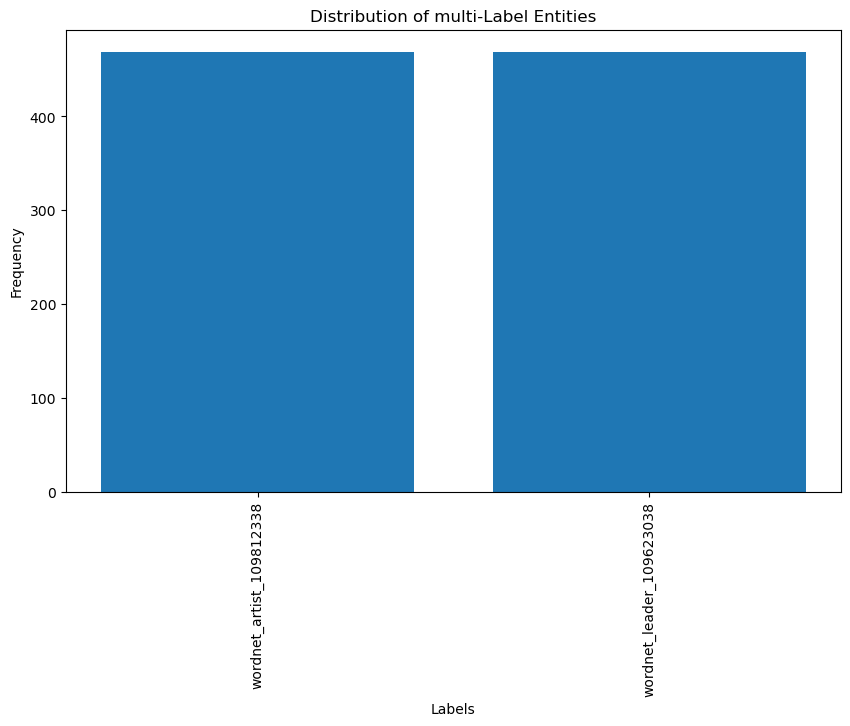

In [35]:
def visualize_multi_label_distribution(reference_data):

    # Identify multi-label entities
    multi_label_entities = reference_data.groupby('entities')['classes'].nunique()
    multi_label_entities = multi_label_entities[multi_label_entities > 1].index.tolist()

    # Count the number of entities with each label
    label_counts = reference_data[reference_data['entities'].isin(multi_label_entities)]['classes'].value_counts()

    # Plot the distribution
    plt.figure(figsize=(10, 6))
    plt.bar(label_counts.index, label_counts.values)
    plt.xlabel('Labels')
    plt.ylabel('Frequency')
    plt.title('Distribution of multi-Label Entities')
    plt.xticks(rotation=90)
    plt.show()


# Visualizing word distributions for entities with multi labels
visualize_multi_label_distribution(reference_data)

save tree to evaluate

In [ ]:
! python print-tree.py '../nHDP_matlab/output/tree/freebase/20240102_nhdp_tree_freebase_po_t22_b1_1000_172952.csv' 'data/fb15k-237/vocab_po_20240102172952.txt'
! python save_tree.py '../nHDP_matlab/output/tree/freebase/20240102_nhdp_tree_freebase_po_t22_b1_1000_172952.csv' 'data/fb15k-237/vocab_po_20240102172952.txt' 'output/20240102_nhdp_tree_freebase_po_t22_b1_1000_172952.csv'